In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
pip install pandas-profiling

In [4]:
df=pd.read_csv("winequality-red.csv")

FileNotFoundError: [Errno 2] No such file or directory: 'Microsoft_Stock'

## Using pandas profile report to know about data:

In [5]:
report=pp.ProfileReport(df,title = "Pandas Profile Report")
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## EDA of Wine Quality dataset

In [6]:
df.shape

(1599, 12)

In [7]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [8]:
print(df['quality'].unique())

[5 6 7 4 8 3]


In [9]:
##check missing values
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

It turns out that the dataset does not have null values. The dataset consists of 1599 rows and 12 columns. The data type of all variables are numeric.

## Statistics about all the features of dataset:

In [10]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [11]:
#The average value of fixed acidity is 8.31, the highest value is 15.9
#The average value of volatile acidity is 0.52, the highest value is 1.58
#The average value of citric acid is 0.27, the highest value is 1
#The average value of residual sugar is 2.53, the highest value is 15.5
#The average value of chlorides is 0.08, the highest value is 0.61
#The average value of free sulfur dioxide is 15.87, the highest value is 72
#The average value of total sulfur dioxide is 46.46, the highest value is 289
#The average value of density is 0.99, the highest value is 1
#The average value of pH is 3.31, the highest value is 4.01
#The average value of sulphates is 0.65, the highest value is 2
#The average value of alcohol is 10.42, the highest value is 14.90
#The average value of quality is 5.63, the highest value is 8

In [12]:
import seaborn as sns

# Quality Distribution

<AxesSubplot:xlabel='quality', ylabel='Density'>

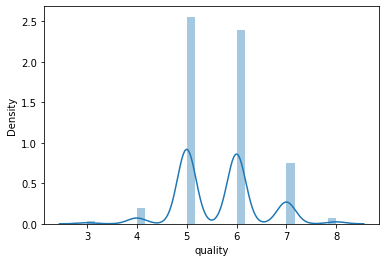

In [13]:
sns.distplot(df['quality'],kde=True)

From distplot it can be seen that distribution has two peaks at 5 and 6.

<AxesSubplot:xlabel='quality', ylabel='count'>

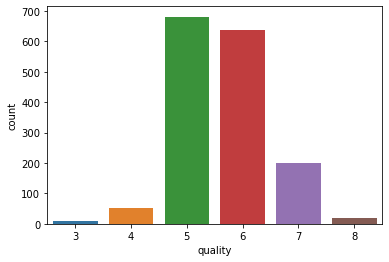

In [14]:
sns.countplot( x="quality", data=df)

Boxplot shows that Dataset has mostly wine quality as 5 and 6.

## Distribution of the data

1. We need to know how the data are distributed to determine the most appropriate statistical analyses to use.
2. Plotting the histogram with KDE curve to know about the distribution of the data:

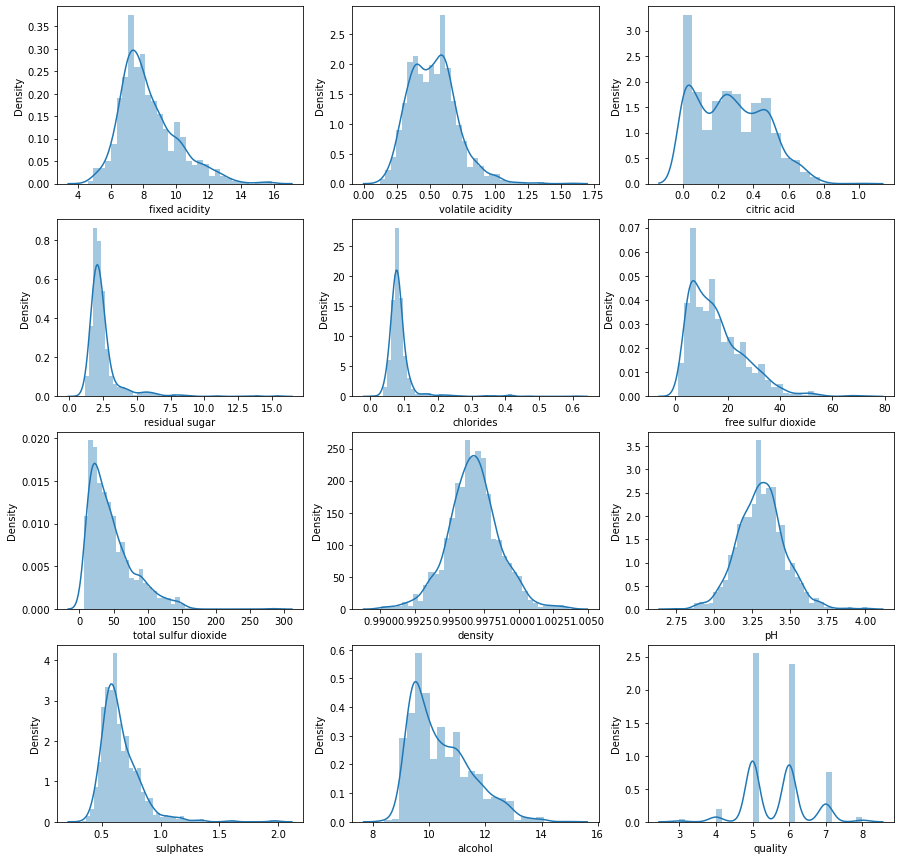

In [15]:
j=1 
fig = plt.figure(figsize = (15,15))
for i in df.columns:
    plt.subplot(4,3,j)
    sns.distplot(df[i])
    j=j+1

1. Almost all the features are in skewed format we will deal with them later section of this notebook.
Since the data is skewed it must be having outlier. plotting boxplots.
2. The values of 'pH' and "density" variables are relatively normally distributed.

## Bar graphs of various variables from dataset with respect to Quality

In [16]:
def feature_name(fname):
  
 sns.barplot(y=fname, x="quality", data=df)

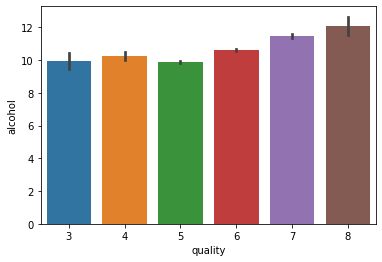

In [17]:
# Alcohol vs Quality
feature_name("alcohol")

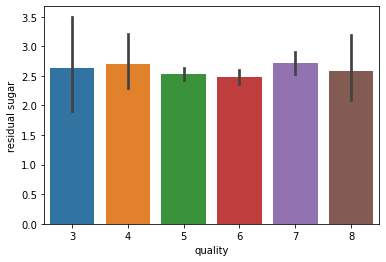

In [18]:
#Residual sugar vs Quality
feature_name("residual sugar")

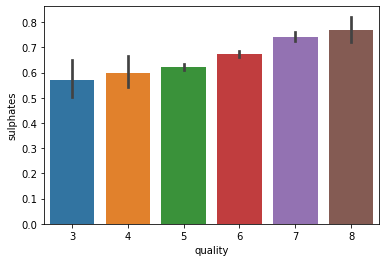

In [19]:
#Sulphate vs Quality
feature_name("sulphates")

Good quality Wine have more sulphates.

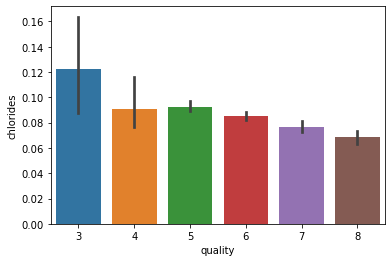

In [20]:
##Chlorides vs Quality
feature_name("chlorides")

Good quality wine have less chlorides.

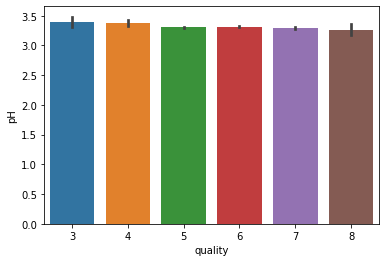

In [21]:
##Ph vs Quality
feature_name("pH")

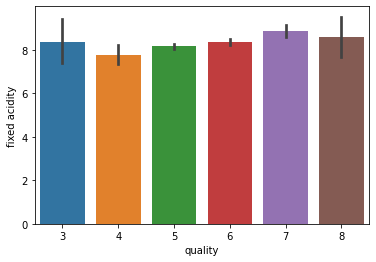

In [22]:
#fixed acidity vs Quality
feature_name("fixed acidity")

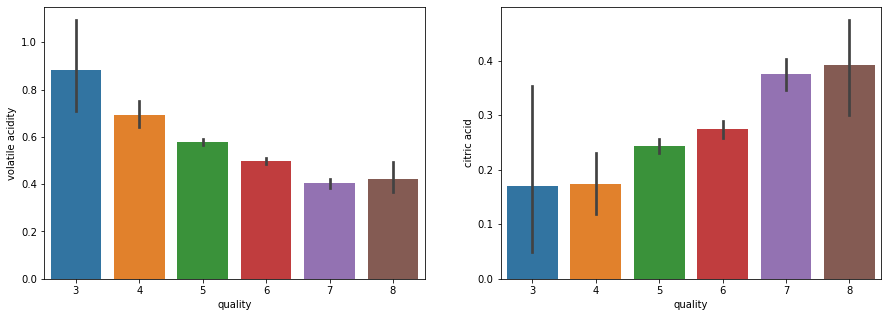

In [23]:
fig = plt.figure(figsize=(15,5))
plt.subplot(121)
feature_name("volatile acidity")
plt.subplot(122)
feature_name("citric acid")

1. a wine is of top quality if it's volatile acidity is less.
2. Top quality wines usually have high citric acid.

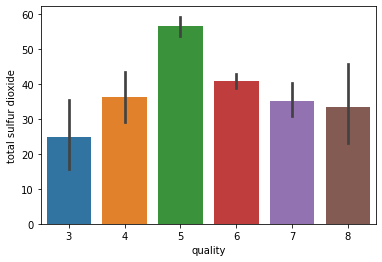

In [24]:
#total sulfur dioxide vs quality
feature_name("total sulfur dioxide")

## Pairplot of the dataset with hue as Wine Quality

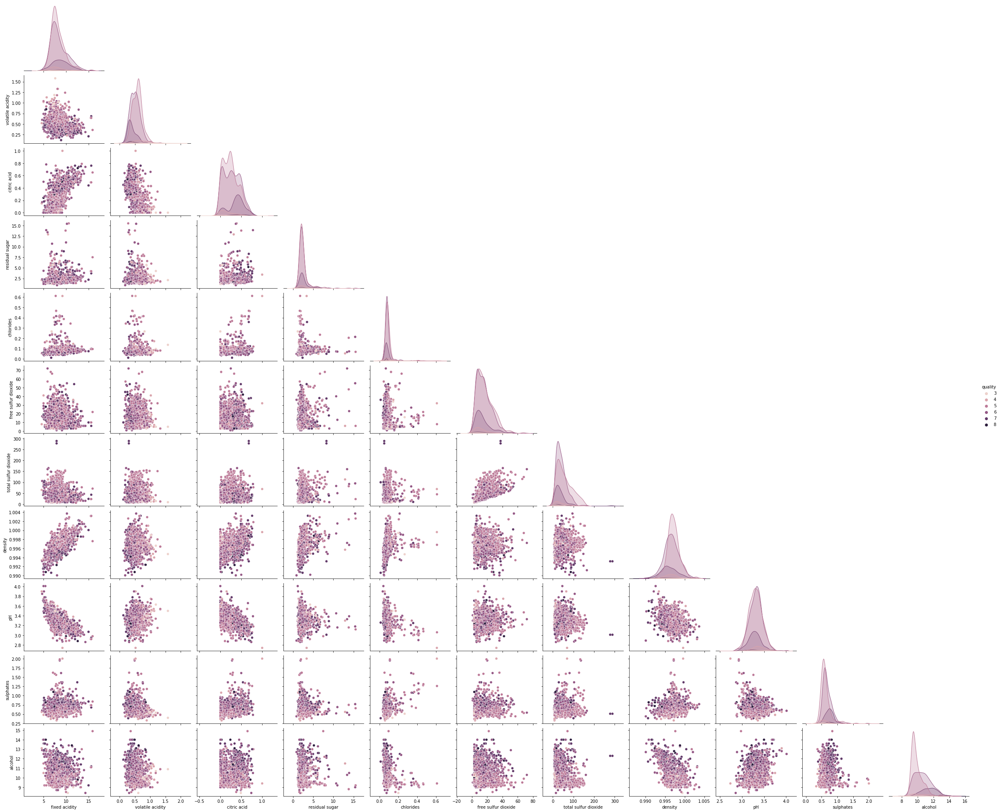

In [25]:
sns.pairplot(df, hue = 'quality' ,aspect = 1.2, corner = True)

1. Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters. It also helps to form some simple classification models by drawing some simple lines or make linear separation in our dataset.
2. We see here that there is correlation between some variables. And this is what we don't want. This problem is called 'multicollinearity'

## Plotting Histogram to check the distribution of the each variable

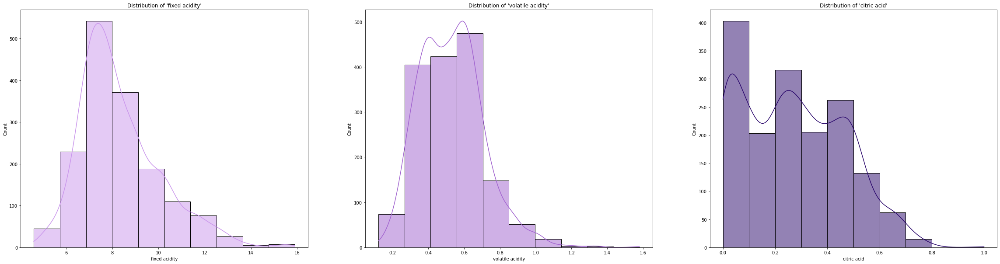

In [26]:
fig, axes = plt.subplots(1, 3, figsize = (40, 10))

sns.histplot(ax = axes[0], x = df["fixed acidity"],
             bins = 10,
             kde = True,
             cbar = True,
             color = "#CA96EC").set(title = "Distribution of 'fixed acidity'");

sns.histplot(ax = axes[1], x = df["volatile acidity"],
             bins = 10,
             cbar = True,
             kde = True,
             color = "#A163CF").set(title = "Distribution of 'volatile acidity'");

sns.histplot(ax = axes[2], x = df["citric acid"],
             bins = 10,
             kde = True,   
             cbar = True,
             color = "#29066B").set(title = "Distribution of 'citric acid'");

1. The values of the variable 'fixed_acidity' are relatively normally distributed (but a bit left skewed). But there are two peaks in the distributions of other 'volatile_acidity' and 'citric_acid' variables.

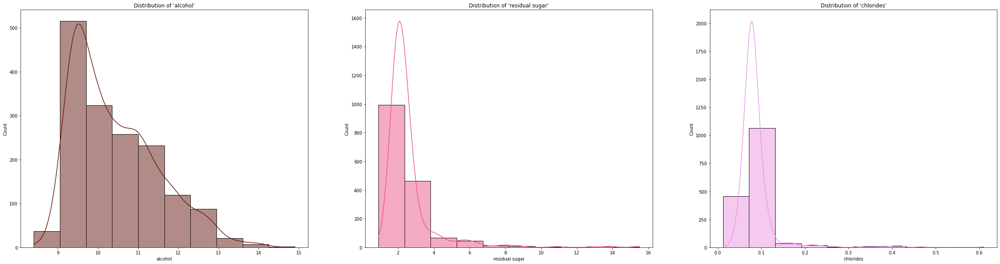

In [27]:
fig, axes = plt.subplots(1, 3, figsize=(40, 10))

sns.histplot(ax = axes[0], x = df["alcohol"],
             bins = 10,    
             kde = True,
             cbar = True,
             color = "#641811").set(title = "Distribution of 'alcohol'");

sns.histplot(ax = axes[1], x = df["residual sugar"],
             bins = 10,
             kde = True,
             cbar = True,
             color = "#EB548C").set(title = "Distribution of 'residual sugar'");

sns.histplot(ax = axes[2], x = df["chlorides"],
             bins = 10,
             kde = True,   
             cbar = True,
             color = "#EC96E0").set(title = "Distribution of 'chlorides'");

1. Distributions of alchohol, residual_sugar and chloride variables are not normal.

## Scatterplots from the data with respect to Quality

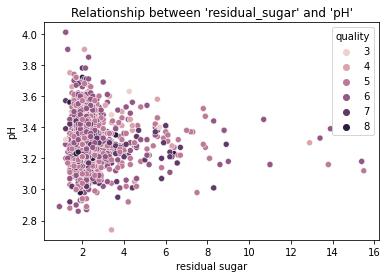

In [28]:
sns.scatterplot(x = "residual sugar",
                y = "pH",
                hue = "quality",
                data = df).set(title = "Relationship between 'residual_sugar' and 'pH'");

1. Scatter plots are used to plot data points on a horizontal and a vertical axis in the attempt to show how much one variable is affected by another.
2. There is not correlation between 'residual_sugar' and 'pH' variables

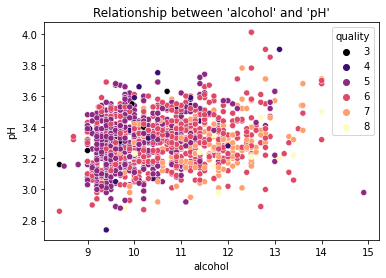

In [29]:
sns.scatterplot(x = "alcohol",
                y = "pH",
                hue = "quality",
                palette = "magma",
                data = df).set(title = "Relationship between 'alcohol' and 'pH'");

1. There is not correlation between 'alcohol' and 'pH' variables

There are negative linear relationships between the "alcohol" - "volatile acidity" and "alcohol" - "total_sulfur_dioxide" variables.

## Heatmap of the data

The primary purpose of Heat Maps is to better visualize the volume of locations/events within a dataset and assist in directing viewers towards areas on data visualizations that matter most.

<AxesSubplot:>

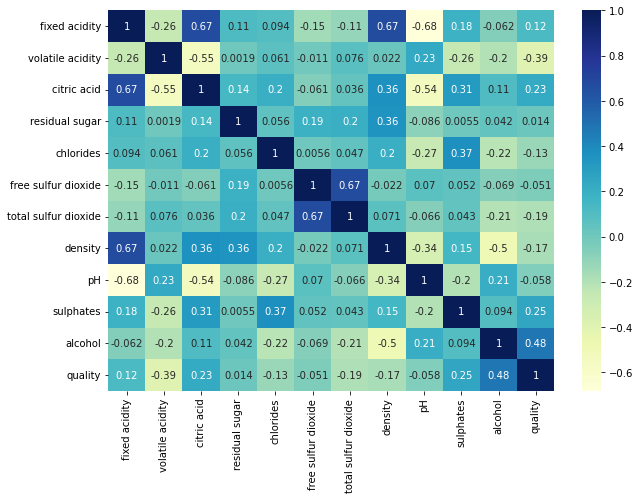

In [30]:
plt.figure(figsize=(10,7))
sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)

There is no highly correlated values.

Still Alcohol (0.48), Citric Acid (0.23) and Sulphates (0.25) have the highest correlation to Quality

However, Volatile Acidity has a high negative correlation at (-0.39)

1. fixed acidity has comparatively high correlation(>0.6) with density and citric acid and a negative correlation(<-0.69) with pH.
2. volatile acidity seems to have a negative effect on quality (-0.41).A wine is of top quality if it's volatile acidity is less.
3. free sulfur dioxide is more if total sulfur dioxide is more and vice versa.
4. alcohol is having influence on quality of wine.
5. alcohol and density have a negative correlation(-0.49)
6. pH,free and total sulfure dioxide ,chlorides ,residual sugar do not have high correlation on quality.
7. High Quality wine(7 and 8) have less density to fixed acidity proportion when compared to other wine quality.
8. Top quality wines usually have high citric acid.
Now we will perform analysis on the data with the above observation.

## Let's check how quality of the wine is affected by alcohol content?

Lets plot the bar graph of alchohol with quality again

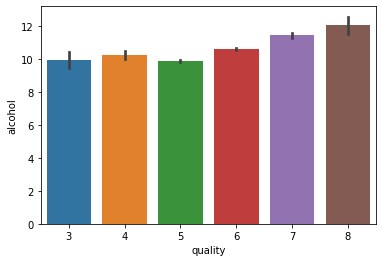

In [31]:
feature_name("alcohol")

So, Quality of the wine improves when we increase it's alcohol content.

## Does alcohol has any realtion with density.. ?

Plotting scatterplot with hue as alcohol to check if there is any relation between density and alcohol:

<AxesSubplot:xlabel='density', ylabel='alcohol'>

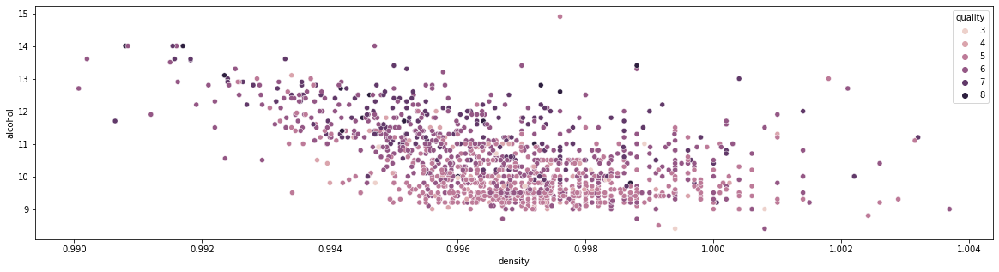

In [32]:
plt.figure(figsize=(20,5))
sns.scatterplot(data = df ,x ='density',y='alcohol',hue ='quality')

Observations:

1. Alcohol composition decreases with increase in density.
2. Finest Wine (7 and 8) have high alcohol content and less density

### Further Plotting KDE curve to compare the probabilty distribution of different qualities wine with alcohol:

In these KDE curves wine qualities 8,7,6,5,4 and 3 are represented by red,blue, aqua, green, coral and tan colored curves 
respectively:

<AxesSubplot:xlabel='alcohol', ylabel='Density'>

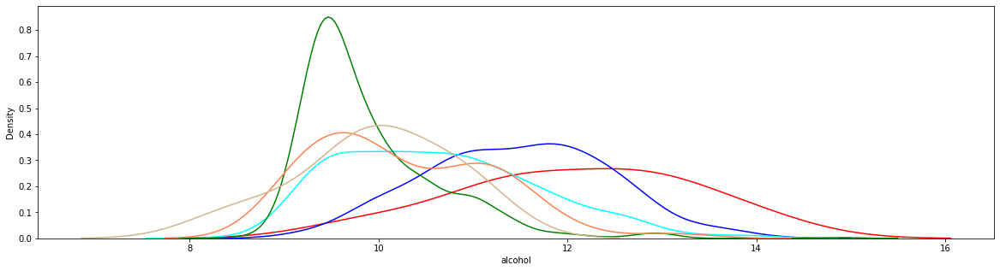

In [33]:
plt.figure(figsize =(20,5))
sns.distplot(df[df['quality'] == 8]['alcohol'],hist=False ,color ='red')
sns.distplot(df[df['quality'] == 7]['alcohol'],hist=False,color ='blue')
sns.distplot(df[df['quality'] == 6]['alcohol'],hist=False,color ='aqua')
sns.distplot(df[df['quality'] == 5]['alcohol'],hist=False,color = 'green')
sns.distplot(df[df['quality'] == 4]['alcohol'],hist=False,color ='coral')
sns.distplot(df[df['quality'] == 3]['alcohol'],hist=False,color ='tan')

Observations:

1. The above kde chart shows us that top quality wine(7 and 8) will have have higher alcohol content.
2. The inferior quality of wine usually has <10% alcohol.

### Further Plotting KDE curve to compare the probabilty distribution of different qualities wine with volatile acidity:

<AxesSubplot:xlabel='volatile acidity', ylabel='Density'>

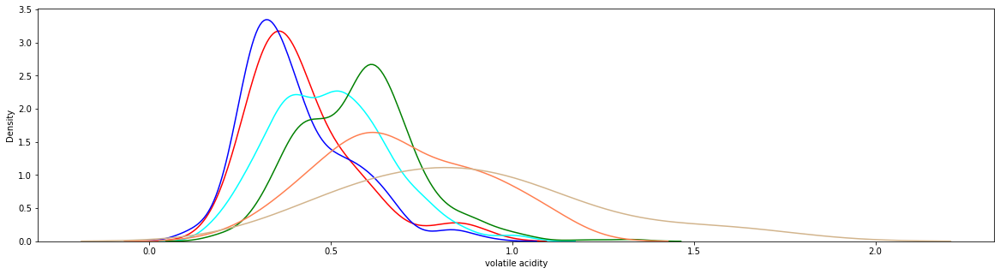

In [34]:
plt.figure(figsize =(20,5))
sns.distplot(df[df['quality'] == 8]['volatile acidity'],hist=False ,color ='red')
sns.distplot(df[df['quality'] == 7]['volatile acidity'],hist=False,color ='blue')
sns.distplot(df[df['quality'] == 6]['volatile acidity'],hist=False,color ='aqua')
sns.distplot(df[df['quality'] == 5]['volatile acidity'],hist=False,color = 'green')
sns.distplot(df[df['quality'] == 4]['volatile acidity'],hist=False,color ='coral')
sns.distplot(df[df['quality'] == 3]['volatile acidity'],hist=False,color ='tan')

Observations:
    
As mentioned before less volatile acidity means great quality of wine. We can see the same thing here as well.   

### Further Plotting KDE curve to compare the probabilty distribution of different qualities wine with Sulphate:

<AxesSubplot:xlabel='sulphates', ylabel='Density'>

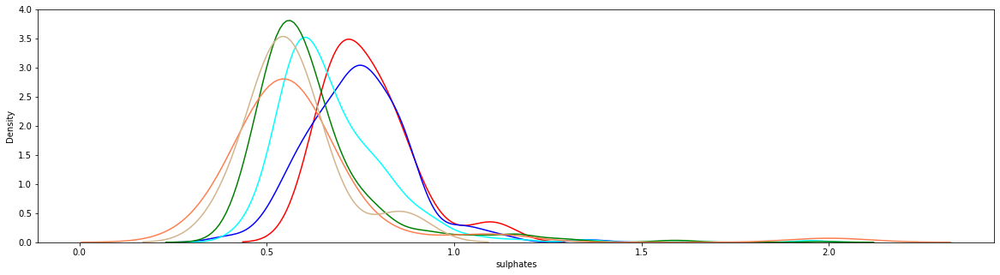

In [35]:
plt.figure(figsize =(20,5))
sns.distplot(df[df['quality'] == 8]['sulphates'],hist=False ,color ='red')
sns.distplot(df[df['quality'] == 7]['sulphates'],hist=False,color ='blue')
sns.distplot(df[df['quality'] == 6]['sulphates'],hist=False,color ='aqua')
sns.distplot(df[df['quality'] == 5]['sulphates'],hist=False,color = 'green')
sns.distplot(df[df['quality'] == 4]['sulphates'],hist=False,color ='coral')
sns.distplot(df[df['quality'] == 3]['sulphates'],hist=False,color ='tan')

Observation:

1. Higher wine quality (7 and 8) will have a slightly higher sulphate content
2. Inferior wine usually have sulphate content around 0.5

# Outliers

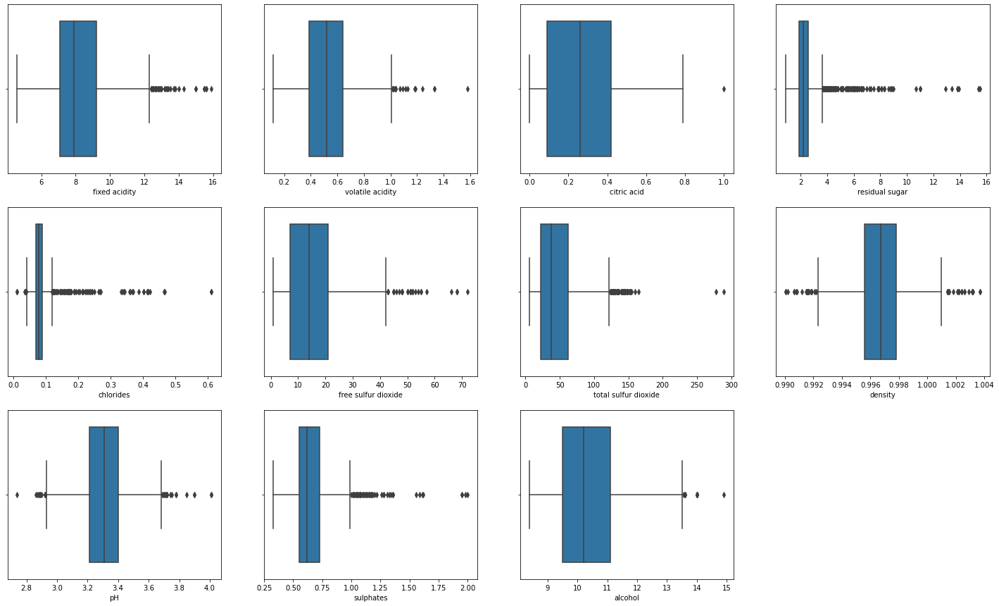

In [36]:
j=1  
fig = plt.figure(figsize = (25,15))
for i in ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol']:
    plt.subplot(3,4,j)
    sns.boxplot(df[i])
    j=j+1 

So one of the reasons why model has poor quality is data-imbalance. There are several ways how we can deal with this: balancing the dataset or using class weights

In [37]:
num_columns =df.describe().columns.tolist()
num_columns.pop()

'quality'

In [38]:
def find_boundaries(df, variable, distance):
 IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)
 lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
 upper_boundary = df[variable].quantile(0.75) + (IQR * distance)
 return upper_boundary, lower_boundary

In [39]:
#here we are determin upper and lower limit only on the basis of train set

for feature in num_columns:
    upper_limit,lower_limit=find_boundaries(df,feature,1.5)
    print(feature," upper-->",upper_limit.round(4),"lower-->",lower_limit.round(4),"\n","----------------------------------------------------")

fixed acidity  upper--> 12.35 lower--> 3.95 
 ----------------------------------------------------
volatile acidity  upper--> 1.015 lower--> 0.015 
 ----------------------------------------------------
citric acid  upper--> 0.915 lower--> -0.405 
 ----------------------------------------------------
residual sugar  upper--> 3.65 lower--> 0.85 
 ----------------------------------------------------
chlorides  upper--> 0.12 lower--> 0.04 
 ----------------------------------------------------
free sulfur dioxide  upper--> 42.0 lower--> -14.0 
 ----------------------------------------------------
total sulfur dioxide  upper--> 122.0 lower--> -38.0 
 ----------------------------------------------------
density  upper--> 1.0012 lower--> 0.9922 
 ----------------------------------------------------
pH  upper--> 3.685 lower--> 2.925 
 ----------------------------------------------------
sulphates  upper--> 1.0 lower--> 0.28 
 ----------------------------------------------------
alcohol  upper--

In [40]:
pip install feature-engine

Note: you may need to restart the kernel to use updated packages.


In [41]:
from feature_engine.outliers import OutlierTrimmer

In [42]:
# set up the capper
capper = OutlierTrimmer(capping_method='iqr', tail='both', fold=1.5,variables=num_columns)
# here we are using capping method =iqr rule 
#we have other options as well like gaussian and quantile

wine_copy=df.copy()
# fit the capper
capper.fit(wine_copy)

OutlierTrimmer(capping_method='iqr', fold=1.5, tail='both',
               variables=['fixed acidity', 'volatile acidity', 'citric acid',
                          'residual sugar', 'chlorides', 'free sulfur dioxide',
                          'total sulfur dioxide', 'density', 'pH', 'sulphates',
                          'alcohol'])

## Results from EDA

1. Dataset is a imabalance dataset.
2. Dataset have 0 null values
3. The dataset consists of 1599 rows and 12 columns. The data type of all variables are numeric.
4. Mean, standard daviation of target variable that is Quality is 5.63 and 0.80 respectively.
5. There is 'multicollinearity' problem
6. Here we see that there is relatively high (0.67, positive) correlation between 'free sulfur dioxide' and 'total_sulfur_dioxide' variables. There is relatively high (-0.68, negative) correlation between "pH" and "fixed_acidity" variables. And there is about 0.5 correlation between some of other variables.
7. The values of 'pH' and "density" variables are relatively normally distributed.
8. There is not correlation between 'alcohol' and 'pH' variables
9. There is not correlation between 'residual_sugar' and 'pH' variables
10. The values of the variable 'fixed_acidity' are relatively normally distributed (but a bit left skewed). But there are two peaks in the distributions of other 'volatile_acidity' and 'citric_acid' variables.
11. Distributions of alchohol, residual_sugar and chloride variables are not normal.
12. Dataset has mostly wine quality as 5 and 6.
13. high quality Wine have more sulphates.
14. high quality wine have less chlorides.
15. Top quality wines usually have high citric acid.
16. A wine is of top quality if it's volatile acidity is less.
17. Top quality wines usually have high alcohol.

In [43]:
#In this dataset quality range is between 3 and 8
#We will divide quality range into two parts for further modeling ( 3-5 is bad quality and 6-8 is good quality wine)

## Data Preprocessing

Converting wines quality to good and bad. We will perform a binary Classification:

In [44]:
my_bins = (2, 6.5, 8)
groups = ['bad', 'good']
df['quality'] = pd.cut(df['quality'], bins = my_bins, labels = groups)

Performing label encoding on our quality column:

<AxesSubplot:ylabel='quality'>

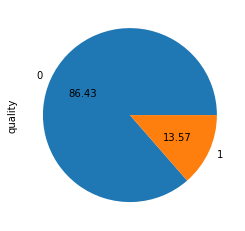

In [45]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['quality']= le.fit_transform(df['quality'])
df['quality'].value_counts().plot(kind = 'pie',autopct ='%.2f')

In [46]:
#  0 - bad
#  1 - good

## Train and Test data split

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [48]:
X = df.iloc[:,0:11]
y = df['quality']

In [49]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2, random_state =12)

## Feature Importance

In [50]:
import xgboost
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,VotingClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [51]:
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train,y_train)
y_pred = rf_clf.predict(X_test)

Let's check what all features are important for wine quality.

In [52]:
for name, score in zip(X.columns, rf_clf.feature_importances_):
    print(name, score *100)

fixed acidity 7.332556910190929
volatile acidity 11.352453068737262
citric acid 8.999404045663557
residual sugar 5.730692472539105
chlorides 6.7293292900361426
free sulfur dioxide 6.081484865965315
total sulfur dioxide 7.799039826244998
density 9.518771137120005
pH 5.993551006234258
sulphates 12.547773688551978
alcohol 17.914943688716463


Alcohol, sulphate have most feature importance, then volatile acidity, citric acid, fixed acidity and density also have more feature importance than remaining.

### Plotting a bar graph to analyse feature importance more accurately:

<AxesSubplot:xlabel='Features', ylabel='%Importance'>

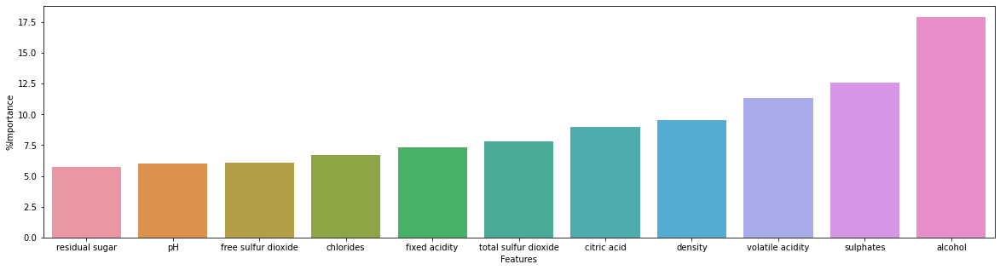

In [53]:
data = {'Features': X.columns , '%Importance': rf_clf.feature_importances_ * 100 }
temp = pd.DataFrame(data)

plt.figure(figsize =(20,5))
sns.barplot(data =temp.sort_values(by =['%Importance']) ,x='Features', y ='%Importance')

Observations:

1. Alcohol is the most important feature
2. Volatile acidity are the second most important feature
3. Followed by Sulphates and density


Dropping features which do not have much importance.

In [54]:
df.drop(columns = ['pH','free sulfur dioxide','chlorides','residual sugar','total sulfur dioxide'] , inplace = True)

Doing a new train test split.

In [57]:
X = df.drop(columns = 'quality')
y= df['quality']

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2, random_state =12)

## Feature Scaling

Applying StandardScaler before fitting ML model to normalize the features.

In [58]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit_transform(X_train)
sc.transform(X_test)

array([[ 0.45631858,  0.40050009, -1.3895956 ,  0.50570032, -0.16738383,
        -0.02929618],
       [-0.87577666, -0.32556598, -0.97896942, -0.63918339, -0.04904004,
        -0.76761773],
       [-0.06493608,  1.1824174 , -0.92764115, -1.35143822, -0.52241521,
         1.26276653],
       ...,
       [ 0.05089829, -0.88407835,  0.81752013, -0.65501127,  0.8977103 ,
         0.70902537],
       [-1.33911414, -0.60482217, -0.41435842, -0.8027382 ,  0.72019461,
        -0.39845696],
       [-0.52827355,  0.40050009, -0.05506051, -0.3067978 , -0.58158711,
        -0.58303735]])

## Model Building

In [59]:
log_clf = LogisticRegression()
dt_clf = DecisionTreeClassifier()
rf_clf = RandomForestClassifier()
svm_clf = SVC(probability =True)
knn_clf = KNeighborsClassifier()
ada_clf = AdaBoostClassifier()
xgb_clf= XGBClassifier()

voting_clf = VotingClassifier(
 estimators=[('lr', log_clf), ('rf', rf_clf), ('svc', svm_clf), ('knn',knn_clf),('dt',dt_clf)],
 voting='hard',n_jobs = -1)


voting_clf.fit(X_train, y_train)
for clf in (log_clf, rf_clf, svm_clf,knn_clf,dt_clf,voting_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred) * 100)
    

LogisticRegression 86.5625
RandomForestClassifier 90.9375
SVC 87.1875
KNeighborsClassifier 86.25
DecisionTreeClassifier 85.0
VotingClassifier 88.125


With Voting Classifier we are able to achieve highest accuracy. While Random Forest alone has more accuracy than Voting Classifier's accuracy. We may need to improve hyperparameters of our models.

### Let's find the best hyperparameter using GRID Search CV

In [60]:
import numpy as np

In [61]:
para_knn = {'n_neighbors':np.arange(1, 50)}
grid_knn = GridSearchCV(knn_clf, param_grid=para_knn, cv=5)
para_dt = {'criterion':['gini','entropy'],'max_depth':np.arange(1, 50), 'min_samples_leaf':[1,2,4,5,10,20,30,40,80,100]}
grid_dt = GridSearchCV(dt_clf, param_grid=para_dt, cv=5)
param_rf = {'n_estimators':[100,200, 350, 500], 'min_samples_leaf':[2, 10, 30]}
grid_rf = GridSearchCV(rf_clf, param_grid=param_rf, cv=5)
param_log = {'penalty':['l2','l1'] }
grid_log = GridSearchCV(log_clf,param_grid= param_log , cv=5)

params_ada = {'n_estimators': [50,100,250,400,500,600], 'learning_rate': [0.2,0.5,0.8,1]}
grid_ada =  GridSearchCV(ada_clf, param_grid=params_ada, cv=5)


params_xgb = {'n_estimators': [50,100,250,400,600,800,1000], 'learning_rate': [0.2,0.5,0.8,1]}
grid_xgb =  RandomizedSearchCV(xgb_clf, param_distributions=params_xgb, cv=5)

In [62]:
grid_knn.fit(X_train, y_train)
grid_dt.fit(X_train, y_train)
grid_rf.fit(X_train, y_train)
grid_ada.fit(X_train, y_train)
grid_xgb.fit(X_train, y_train)


classifiers = ['grid_log','grid_knn','grid_dt','grid_rf','grid_ada','grid_xgb']


print("parameters for KNN:", grid_knn.best_params_)
print("parameters for Decision Tree:", grid_dt.best_params_)
print("parameters for Random Forest:", grid_rf.best_params_)
print("parameters for AdaBoost:", grid_ada.best_params_)
print("parameters for XGBoost:", grid_xgb.best_params_)

parameters for KNN: {'n_neighbors': 10}
parameters for Decision Tree: {'criterion': 'gini', 'max_depth': 21, 'min_samples_leaf': 2}
parameters for Random Forest: {'min_samples_leaf': 2, 'n_estimators': 100}
parameters for AdaBoost: {'learning_rate': 0.5, 'n_estimators': 500}
parameters for XGBoost: {'n_estimators': 400, 'learning_rate': 0.8}


In [63]:
knn = KNeighborsClassifier(n_neighbors= 10)
dt = DecisionTreeClassifier(criterion= 'gini', max_depth= 33, min_samples_leaf= 2)
rf = RandomForestClassifier(min_samples_leaf= 2, n_estimators = 100)
ada =AdaBoostClassifier(learning_rate= 0.5, n_estimators= 500)
xgb = XGBClassifier(n_estimators= 800, learning_rate= 0.5)

In [64]:
for clf in (knn, dt, rf, ada,xgb):
     clf.fit(X_train, y_train)
     y_pred = clf.predict(X_test)
     print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

KNeighborsClassifier 0.871875
DecisionTreeClassifier 0.8625
RandomForestClassifier 0.89375
AdaBoostClassifier 0.865625
XGBClassifier 0.884375


After changing the hyperparameters accuracies are as writtten above.

### Now lets try different models to have better scores

In [65]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
dtc_pred_score = dtc.score(X_test, y_test)

In [66]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()
dtr.fit(X_train, y_train)
dtr_pred_score = dtr.score(X_test, y_test)

In [67]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
rfc_pred_score = rfc.score(X_test, y_test)

In [68]:
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression()
lg.fit(X_train, y_train)
lg_pred_score = lg.score(X_test, y_test)

In [84]:
data = {'Model': ['Decision Classifier','Decision Regressor','Random Forest Classifier', 'Logistic Regression','KNeighborsClassifier' 
                                    ,'AdaBoostClassifier' 
                                    ,'XGBClassifier','SVC','VotingClassifier'],
        'accuracy': [dtc_pred_score, dtr_pred_score, rfc_pred_score, lg_pred_score, '0.871875','0.865625','0.884375',' 87.1875','89.0625']}
accuracy = pd.DataFrame(data)
    
accuracy

,Model,accuracy
0,Decision Classifier,0.85625
1,Decision Regressor,-0.202902
2,Random Forest Classifier,0.903125
3,Logistic Regression,0.865625
4,KNeighborsClassifier,0.871875
5,AdaBoostClassifier,0.865625
6,XGBClassifier,0.884375
7,SVC,87.1875
8,VotingClassifier,89.0625


### * Random forest classifier have the highest accuracy. *

### Using cross validation on random forest classifier to increase the score:

In [72]:
from sklearn.model_selection import cross_val_score

rfc_eval = cross_val_score(estimator=rfc, X=X_train, y=y_train, cv=10)
rfc_eval.mean()

0.9085322342519685

Random forest accuracy increases from .9000 to .9085  using cross validation score

In [71]:
def get_metrics(model):
    predictions = model.predict(X_test)
    
    pred_proba = model.predict_proba(X_test)[::,1]
    roc_auc = roc_auc_score(y_test,pred_proba)
    precision = precision_score(y_test,predictions)
    accuracy = accuracy_score(y_test,predictions)
    recall = recall_score(y_test,predictions)
    f1 = f1_score(y_test,predictions)
    
    print(f"Performance Metrics for {model} model:")
    print(f"ROC AUC:{roc_auc}\nPrecision:{precision}\nAccuracy:{accuracy}\nrecall:{recall}\nF1:{f1}\n")

In [73]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix

In [74]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

### KNN Model

In [75]:
# training the KNN model
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

get_metrics(knn)

Performance Metrics for KNeighborsClassifier() model:
ROC AUC:0.7734504764402483
Precision:0.4444444444444444
Accuracy:0.8625
recall:0.2926829268292683
F1:0.3529411764705882



### RandomForestClassifier

In [85]:
rf_clf = RandomForestClassifier(n_estimators=300,criterion='entropy',
                             max_features='sqrt',min_samples_leaf=10,random_state=100).fit(X_train,y_train)
rf_clf.fit(X_train, y_train)
rfc_pred_score = rf_clf.score(X_test, y_test)
# Make predictions
train_predictions = rf_clf.predict(X_train)
test_predictions = rf_clf.predict(X_test)

In [86]:
print('The Training accuracy Score is', accuracy_score(train_predictions, y_train))
print('The Testing accuracy Score is', accuracy_score(test_predictions, y_test))

The Training accuracy Score is 0.9171227521501173
The Testing accuracy Score is 0.878125


In [87]:
param_rf = {'n_estimators':[90, 100, 200, 350, 500], 'min_samples_leaf':[1,2,5, 10, 30]}
grid_rf = GridSearchCV(rf_clf, param_grid=param_rf, cv=5)

In [88]:
grid_rf.fit(X_train, y_train)


classifiers = ['grid_rf']


print("parameters for rf:", grid_rf.best_params_)

parameters for rf: {'min_samples_leaf': 1, 'n_estimators': 350}


In [89]:
rf = RandomForestClassifier(min_samples_leaf= 1, n_estimators = 100)
rf.fit(X_train, y_train)
rfc_pred_score = rf.score(X_test, y_test)
# Make predictions
train_predictions = rf.predict(X_train)
test_predictions = rf.predict(X_test)

In [90]:
print('The Training accuracy Score is', accuracy_score(train_predictions, y_train))
print('The Testing accuracy Score is', accuracy_score(test_predictions, y_test))

The Training accuracy Score is 1.0
The Testing accuracy Score is 0.89375


## Using Hyperparameter tuning 

In [91]:
### Manual Hyperparameter Tuning
model=RandomForestClassifier(n_estimators=300,criterion='entropy',
                             max_features='sqrt',min_samples_leaf=10,random_state=100).fit(X_train,y_train)
predictions=model.predict(X_test)
train_predictions = model.predict(X_train)
print(confusion_matrix(y_test,predictions))
print(accuracy_score(y_test,predictions))
print(accuracy_score(train_predictions, y_train))
print(classification_report(y_test,predictions))

[[271   8]
 [ 31  10]]
0.878125
0.9171227521501173
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       279
           1       0.56      0.24      0.34        41

    accuracy                           0.88       320
   macro avg       0.73      0.61      0.64       320
weighted avg       0.85      0.88      0.86       320



After using manual hyperparameter tuning we can see that test score is 0.878 while the training score is 0.917. Therefore the model is overfitting the data.

## RandomizedSearch

In [92]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [93]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(X_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [94]:
rf_randomcv.best_params_

{'n_estimators': 1600,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'log2',
 'max_depth': 890,
 'criterion': 'gini'}

In [95]:
rf_randomcv

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [96]:
best_random_grid=rf_randomcv.best_estimator_

In [97]:
from sklearn.metrics import accuracy_score
y_pred=best_random_grid.predict(X_test)
y_pred_train=best_random_grid.predict(X_train)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Accuracy Score (training) {}".format(accuracy_score(y_pred_train, y_train))) 
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[270   9]
 [ 23  18]]
Accuracy Score 0.9
Accuracy Score (training) 1.0
Classification report:               precision    recall  f1-score   support

           0       0.92      0.97      0.94       279
           1       0.67      0.44      0.53        41

    accuracy                           0.90       320
   macro avg       0.79      0.70      0.74       320
weighted avg       0.89      0.90      0.89       320



After using randomsearch hyperparameter tuning we can see that test score is 0.896875 while the training score is 1. Therefore the model is still overfitting the data.